<details>
   <summary>Metadata</summary>
    title: "E-TRAINEE Tutorial - Raster time series processing in Python using xarray"<br>
    description: "This is a tutorial within the first theme of Module 1 of the E-TRAINEE course."<br>
    lastUpdate: 2025-03-05<br>
    authors: Andreas Mayr<br>
</details>

# Raster time series processing in Python using xarray

This tutorial provides an introduction to raster time series processing with Python using (mainly) the [xarray](https://docs.xarray.dev/en/stable/) package ([Hoyer and Hamman 2017](https://doi.org/10.5334/jors.148)) for multi-dimensional data. Xarray's data structures (`DataArray` and `Dataset`, see [here](https://docs.xarray.dev/en/stable/user-guide/terminology.html)) complement NumPy-like arrays by labels in the form of dimensions, coordinates and attributes, thereby encoding information about how the array values are absolutely related to space, time etc. The labels can also be used to access and analyse the array values. These properties and functionality are very useful if you work with time series of remote sensing images or other raster data.

The Python packages used in this tutorial are contained in the requirements file provided for the course. Please see the instructions on the [software page](https://3dgeo-heidelberg.github.io/etrainee/software/software_python.html) for setting up a Conda environment based on this file.

Data:

As a sample dataset, we use a time series of **Sentinel-2 satellite data** covering a relatively small area around the village of [Obergurgl](https://opentopomap.org/#marker=14/46.87002/11.02611), located in the Central Alps of Tyrol (Austria), and the years 2018 to 2021. This imagery has been queried from the [Google Earth Engine](https://earthengine.google.com/) (GEE), then cloud-masked and exported from GEE as 6-band GeoTiffs, one GeoTiff per scene (see theme 2 for a tutorial on exporting cloudless Sentinel-2 imagery from GEE). You find this dataset in a folder `module1/module1_data/T1/S2` in the [ETRAINEE course datasets](https://doi.org/10.5281/zenodo.10003574).

In [1]:
import pathlib
import glob
import os
from datetime import datetime
import rioxarray
import xarray

## Loading many files of an image time series

We take the set of Sentinel-2 images stored locally as GeoTIFFs (after you downloaded them as the folder `s2` from the course data repository). Using [rioxarray](https://corteva.github.io/rioxarray/stable/index.html), we load all these images to a DataArray and construct a DataSet from them. We follow more or less the approaches described [here](https://knowledge.dea.ga.gov.au/notebooks/How_to_guides/Opening_GeoTIFFs_NetCDFs/#Multiple-GeoTIFFs) and [here](https://medium.com/@bonnefond.virginie/handling-multi-temporal-satellite-images-with-xarray-30d142d3391).

In [ ]:
# Define the path to the s2 directory with the Sentinel-2 image subsets on your local system
in_dir = pathlib.Path('F:/data/etrainee_m1/module1/module1_data/T1/s2')

# Obtain a list of all files to load from the s2 directory (defined previously as in_dir) on your local system
geotiff_list = glob.glob(str(in_dir / '**TPS.tif')) # We use 'TPS' to constrain the granules with better coverage in our AOI which is covered by TPT and TPS granules.

# Helper function to get the datetime index from the filenames
def paths_to_datetimeindex(paths):
    return [datetime.strptime((os.path.basename(i)[0:8]), '%Y%m%d') for i in paths]

# Create a variable used for the time dimension
time_var = xarray.Variable('time', paths_to_datetimeindex(geotiff_list))

# Load in and concatenate all individual GeoTIFFs
S2_da = xarray.concat([rioxarray.open_rasterio(i, masked=True) for i in geotiff_list], dim=time_var)

# Convert the xarray.DataArray into an xarray.Dataset
S2_ds = S2_da.to_dataset('band')

# Rename the variables to the more useful band names
band_names = {1: 'B2', 2: 'B3', 3: 'B4', 4: 'B8', 5: 'B11', 6: 'B12'}     # A dictionary with the names of the Sentinel-2 bands exported earlier.
S2_ds = S2_ds.rename(band_names)

# Drop potential duplicates along the time dimension (if there are multiple images for a time stamp, keep only the first one)
S2_ds = S2_ds.drop_duplicates(dim='time', keep='first')

Many time series operations (such as facetgrid plots and resampling) will not work if there are *duplicates* in the time index (e.g. due to S2 products sensed on the same day but available in two versions with different product generation time stamps). Then you will get (e.g.) an "InvalidIndexError" (Reindexing only valid with uniquely valued Index objects). Therefore, we removed duplicates above.

Now ```S2_ds``` is a DataSet with three dimensions (x, y, time) and six variables (the spectral bands). We add some attributes and fill them with metadata retrieved by the rio accessor. See the result:

In [3]:

# Fill in some of the missing metadata
S2_ds.attrs["crs"] = S2_ds.rio.crs
S2_ds.attrs["resolution"] = S2_ds.rio.resolution()
S2_ds.attrs["units"] = "meters"

S2_ds

<xarray.Dataset> Size: 395MB
Dimensions:      (time: 326, y: 201, x: 251)
Coordinates:
  * x            (x) float64 2kB 6.516e+05 6.516e+05 ... 6.566e+05 6.566e+05
  * y            (y) float64 2kB 5.194e+06 5.194e+06 ... 5.19e+06 5.19e+06
    spatial_ref  int64 8B 0
  * time         (time) datetime64[ns] 3kB 2018-01-02 2018-01-12 ... 2021-09-08
Data variables:
    B2           (time, y, x) float32 66MB nan nan nan nan ... 1.095e+03 nan nan
    B3           (time, y, x) float32 66MB nan nan nan nan ... 1.351e+03 nan nan
    B4           (time, y, x) float32 66MB nan nan nan nan ... 1.445e+03 nan nan
    B8           (time, y, x) float32 66MB nan nan nan nan ... 2.208e+03 nan nan
    B11          (time, y, x) float32 66MB nan nan nan nan ... 2.162e+03 nan nan
    B12          (time, y, x) float32 66MB nan nan nan nan ... 1.658e+03 nan nan
Attributes:
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    AREA_OR_POINT:           Area
    scale_factor:            1.0
    add_offset:              0.0
    crs:                     EPSG:32632
    resolution:              (20.0, -20.0)
    units:                   meters

A `spatial_ref` coordinate with length one was automatically created but is not needed. Let's get rid of this.

In [4]:
S2_ds = S2_ds.drop_vars(names='spatial_ref')    # Drop the variable with specified name
S2_ds

<xarray.Dataset> Size: 395MB
Dimensions:  (time: 326, y: 201, x: 251)
Coordinates:
  * x        (x) float64 2kB 6.516e+05 6.516e+05 ... 6.566e+05 6.566e+05
  * y        (y) float64 2kB 5.194e+06 5.194e+06 5.194e+06 ... 5.19e+06 5.19e+06
  * time     (time) datetime64[ns] 3kB 2018-01-02 2018-01-12 ... 2021-09-08
Data variables:
    B2       (time, y, x) float32 66MB nan nan nan nan ... 1.095e+03 nan nan
    B3       (time, y, x) float32 66MB nan nan nan nan ... 1.351e+03 nan nan
    B4       (time, y, x) float32 66MB nan nan nan nan ... 1.445e+03 nan nan
    B8       (time, y, x) float32 66MB nan nan nan nan ... 2.208e+03 nan nan
    B11      (time, y, x) float32 66MB nan nan nan nan ... 2.162e+03 nan nan
    B12      (time, y, x) float32 66MB nan nan nan nan ... 1.658e+03 nan nan
Attributes:
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    TIFFTAG_RESOLUTIONUNIT:  1 (unitless)
    AREA_OR_POINT:           Area
    scale_factor:            1.0
    add_offset:              0.0
    crs:                     EPSG:32632
    resolution:              (20.0, -20.0)
    units:                   meters

## Working with images and time series

### Plotting

As a next step we will explore some of the xarray plotting possibilities with our image time series. If you need more advanced functionality, try out more specialized packages (such as Cartopy for making maps and hvplot for interactive plots, see [this tutorial](https://tutorial.xarray.dev/scipy-tutorial/04_plotting_and_visualization.html#)).


First, select one scene and one band and plot this:

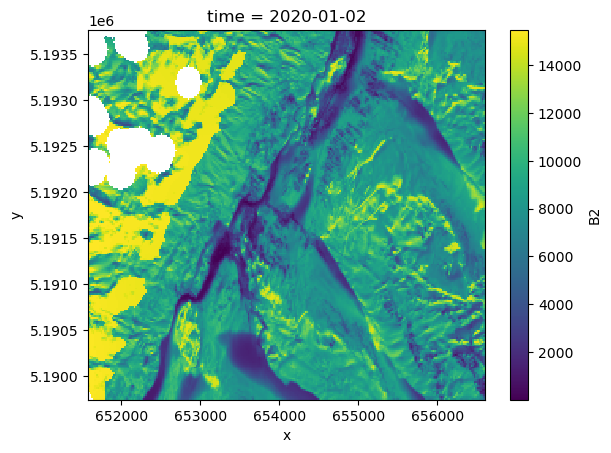

In [5]:
S2_ds.B2.sel(time='2020-01-02').plot()

Other possibilities for plotting include scatter plots, e.g. with two bands plotted against each other:

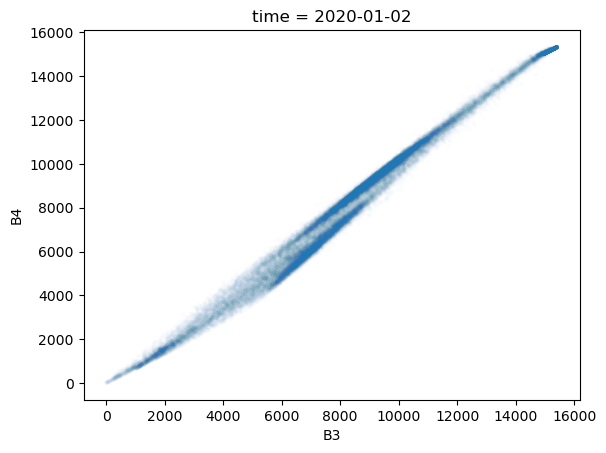

In [6]:
S2_ds.sel(time='2020-01-02').plot.scatter(x='B3', y='B4', marker='.', edgecolor='none', alpha=0.01)

Let's see how many valid observations we have for each pixel.

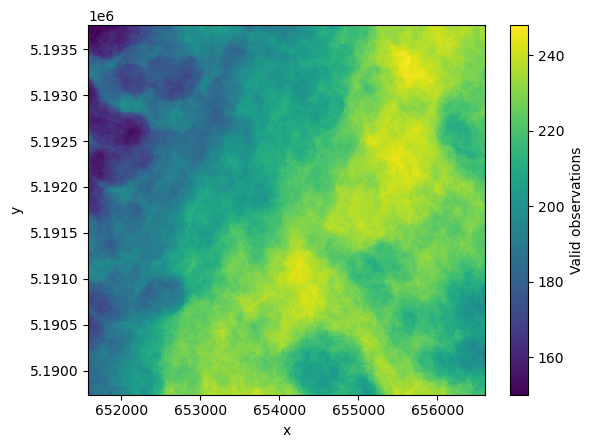

In [7]:
S2_count = S2_ds.B2.count(dim='time')   # Count valid data values of one band along the time dimension
S2_count = S2_count.rename(new_name_or_name_dict='Valid observations')
S2_count.plot()

To plot an RGB image we create a new DataArray with the respective bands from our DataSet, then plot this (plotting functionality of xarray is mainly focused on DataArrays).

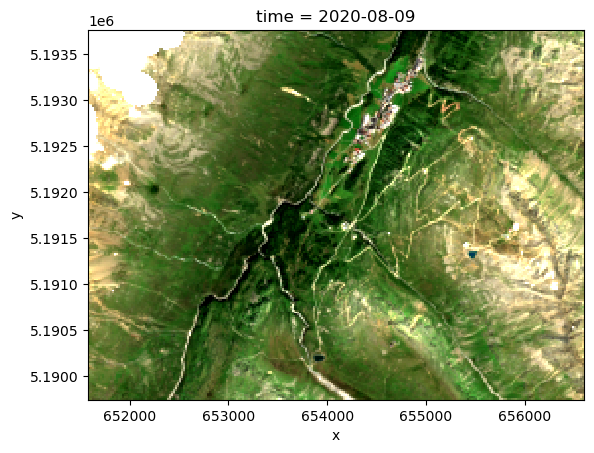

In [8]:
S2_RGB_da = S2_ds[['B4', 'B3', 'B2']].sel(time='2020-08-09').to_array()
S2_RGB_da.plot.imshow(robust=True)

Plot multiple observations within a defined time period, one band only:

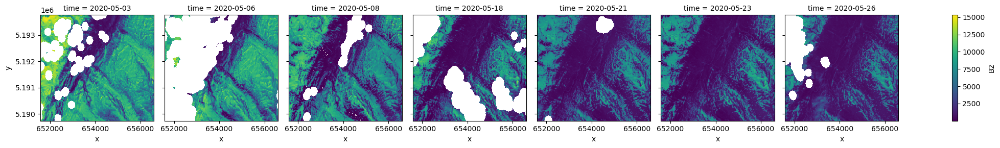

In [9]:
S2_ds.B2.sel(time='2020-05').plot.imshow(col='time')

The same for a 3-band combination (here SWIR-1, near-infrared and blue) and a longer time period:

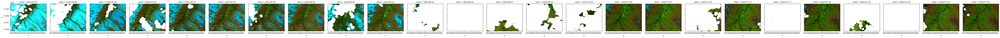

In [10]:
# Create a new DataArray with the respective bands and time period, then plot this
S2_RGB_da = S2_ds[['B11', 'B8', 'B2']].sel(time=slice('2020-05-01', '2020-07-31')).to_array()
S2_RGB_da.plot.imshow(col='time', robust=True)

### Band calculations

As an example for xarray's raster calculator functionality we calculate the Normalized Difference Snow Index (NDSI; <a href="https://doi.org/10.1016/0034-4257(95)00137-P">Hall et al. 1995</a>) for the entire Sentinel-2 time series. We can add it as a new variable to our Sentinel-2 Dataset, thereby keeping our data organised. Alternatively, we can define it as a new DataArray.

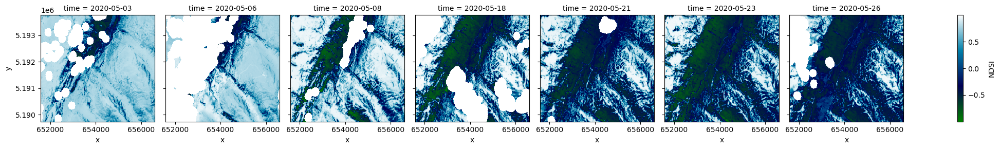

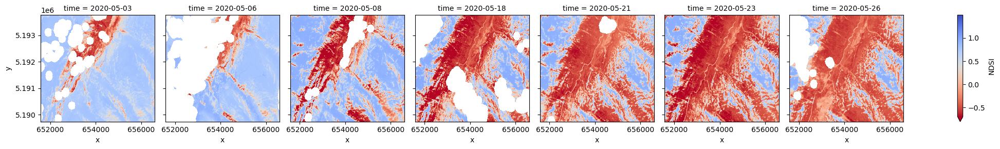

In [11]:
# Compute the NDSI from the SWIR-1 (B11) and green (B3) bands and add as a new variable to our Sentinel-2 Dataset
S2_ds['NDSI'] = (S2_ds.B3 - S2_ds.B11) / (S2_ds.B3 + S2_ds.B11)

# For convenience define NDSI as a new DataArray (Note: metadata, such as the CRS, are not propagated to the new DataArray by default)
NDSI = S2_ds.NDSI

# Show the resulting rasters of one month
# for other colormaps see https://matplotlib.org/stable/gallery/color/colormap_reference.html
NDSI.sel(time='2020-05').plot(col='time', cmap='ocean')
NDSI.sel(time='2020-05').plot(col='time', cmap='coolwarm_r', center=0.4, robust=True)    # center cmap around 0.4, a typical threshold for snow discrimination

### Time series interpolation

For temporal interpolation and aggregation xarray contains some very useful functionality, and much of this works similar as with Pandas. In the rather short time series above we can see the snow disappearing and we also encounter different amounts of valid pixels (white NoData pixels should result from cloud-masking). As a next step, we will fill missing values with different methods.

Can you explain the method-specific differences in the resulting images? Why does the linear interpolation not fill all missing values?

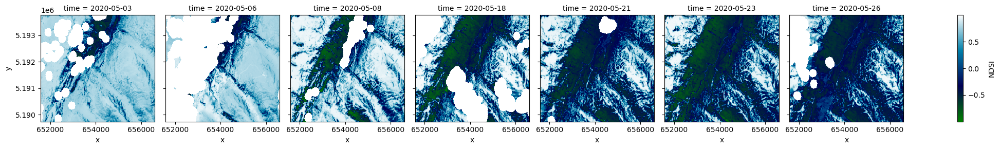

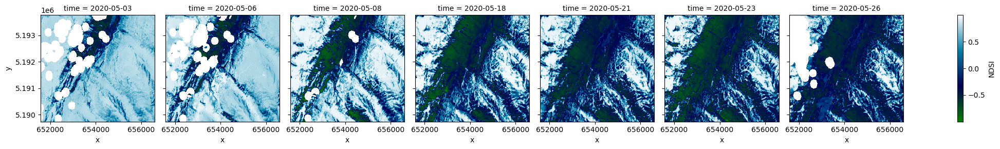

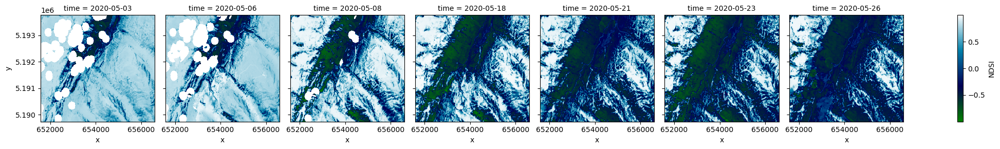

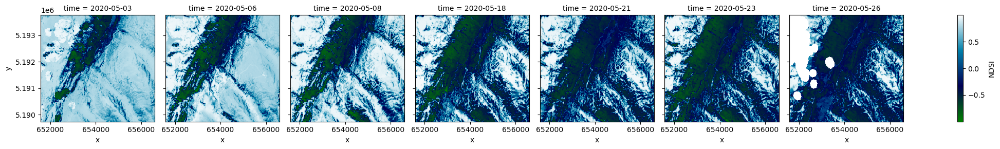

In [12]:
# Plot the original (observed) NDSI values for one month
NDSI.sel(time='2020-05').plot(col='time', cmap='ocean')

# Interpolate missing values in these images and plot (default: linear interpolation)
NDSI.sel(time='2020-05').interpolate_na(dim='time').plot(col='time', cmap='ocean')#(time=new_dates)

# Forward fill missing values in these images and plot (requires the bottleneck package to be installed)
NDSI.sel(time='2020-05').ffill(dim='time').plot(col='time', cmap='ocean')

# Backward fill missing values in these images and plot
NDSI.sel(time='2020-05').bfill(dim='time').plot(col='time', cmap='ocean')

Via matplotlib we have many options for customizing plots (e.g., create subplots), and here we use xarray's possibility to make line plots directly from a DataArray:

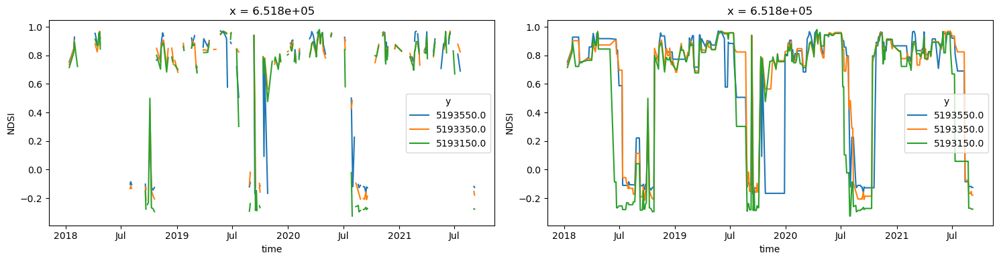

In [13]:
import matplotlib.pyplot as plt                         # for extended plotting functionality

fig, axes = plt.subplots(1, 2, figsize=(15, 4))         # make two subplots next to each other

# Plot NDSI from the original time series
NDSI.isel(x=10, y=[10, 20, 30]).plot.line(ax=axes[0], x='time')

# Forward fill missing values of the entire NDSI time series, select a few locations with constant x and plot the NDSI against time
NDSI.ffill(dim='time').isel(x=10, y=[10, 20, 30]).plot.line(ax=axes[1], x='time')

plt.tight_layout()

... or heatmaps:

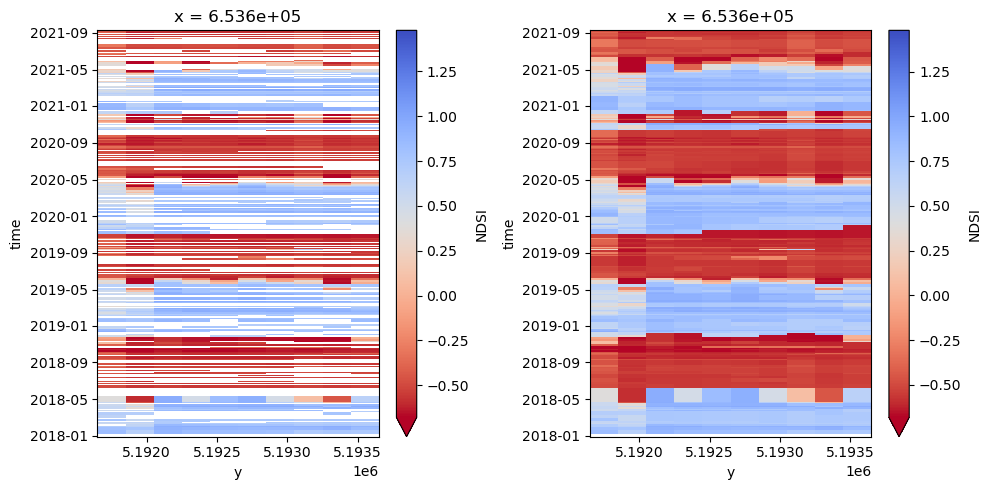

In [14]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))            # make two subplots next to each other

# Plot NDSI heatmap from the original time series (values at locations with constant x and varying y)
NDSI.isel(x=100, y=[10, 20, 30, 40, 50, 60, 70, 80, 90, 100]).plot(ax=axes[0], cmap='coolwarm_r', center=0.4, robust=True)

# Forward fill missing values of the entire NDSI time series, select a few locations with constant x and plot the NDSI heatmap
NDSI.ffill(dim='time').isel(x=100, y=[10, 20, 30, 40, 50, 60, 70, 80, 90, 100]).plot(ax=axes[1], cmap='coolwarm_r', center=0.4, robust=True)

plt.tight_layout()

It is also possible to interpolate other time steps (not covered by a Sentinel-2 overpass). Of course, such processing steps must be used carefully and considered during further analysis and interpretation. Note that the last "new" date cannot be interpolated because there is no data (in the selected subset) after this date.

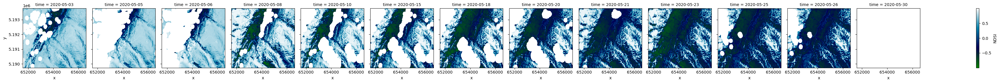

In [15]:
# Interpolate new dates and create a new DataArray
new_dates = ['2020-05-05', '2020-05-10', '2020-05-15', '2020-05-20', '2020-05-25', '2020-05-30']
NDSI_new_dates_da = NDSI.sel(time='2020-05').interp(time=new_dates)

# Concatenate original data and data for new dates, and sort by 'time' (to maintain a chronological order)
NDSI_all_dates_da = xarray.concat(objs=[NDSI.sel(time='2020-05'), NDSI_new_dates_da], dim='time').sortby('time')

# Plot 
NDSI_all_dates_da.plot(col='time', cmap='ocean')

### Time series aggregation

Aggregating over temporal units is straightforward thanks to the time indexing. Here we group all observations of our NDSI time series by month and calculate the averages over these groups, then plot the resulting monthly composite rasters. This temporal aggregation gives a good impression of the typical snow cover distribution in our mountainous area-of-interest across the year.

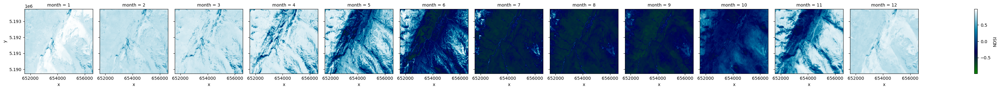

In [16]:
NDSI.groupby('time.month').mean(dim='time').plot(col='month', cmap='ocean')

If we are interested in the variation of snow cover in different months, we can calculate the variance (or the standard deviation) over the months:

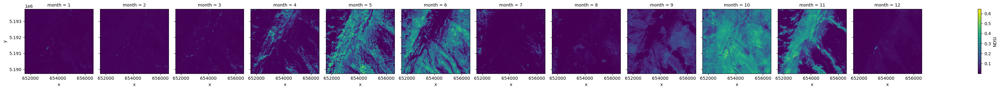

In [17]:
# Group by month and compute the variance of NDSI, then plot
NDSI.groupby('time.month').var(dim='time').plot(col='month')

... or over seasons (named by the months' first letters):

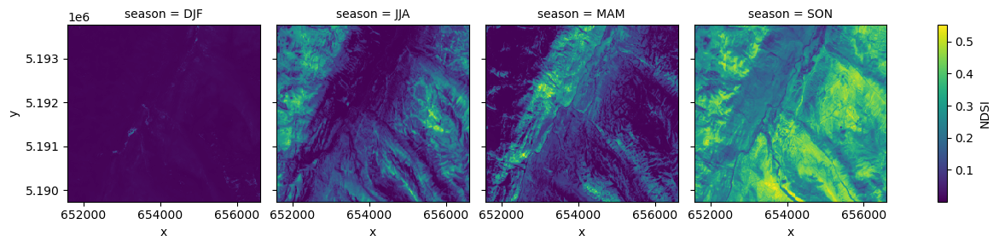

In [18]:
# Group by seasons and compute the variance of NDSI, then plot
# I would prefer a chronological order of seasons but cannot get them sorted easily
NDSI.groupby('time.season').var(dim='time').plot(col='season')

Now let's have a look at monthly NDSI aggregates of different years. We resample to one month temporal resolution by computing the mean, then make a facet plot with 12 columns, so that we get each year in a separate row. For an overview of time series groupers/frequencies, see [here](https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html#offset-aliases).

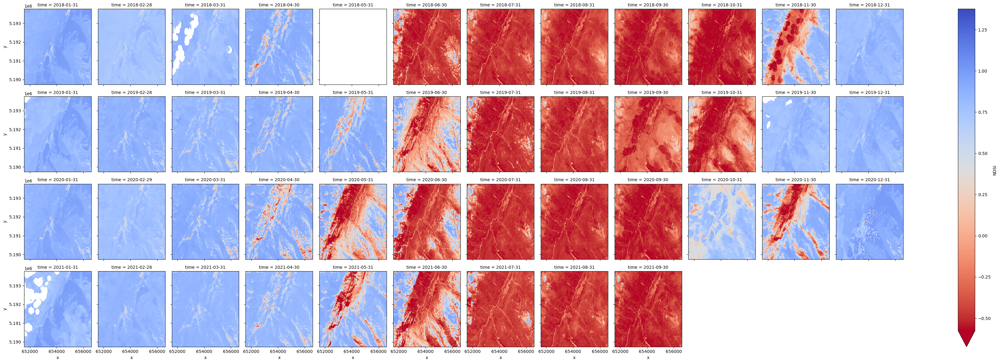

In [22]:
NDSI.resample(time='1ME').mean().plot(col='time', col_wrap=12, cmap='coolwarm_r', center=0.4, robust=True)

There seem to be no images from May 2018 (resulting in a NoData aggregate), and we may be interested in the number of observations for all other months as well. Using ```count()``` instead of ```mean()```, we can inspect the number of valid observations per month:

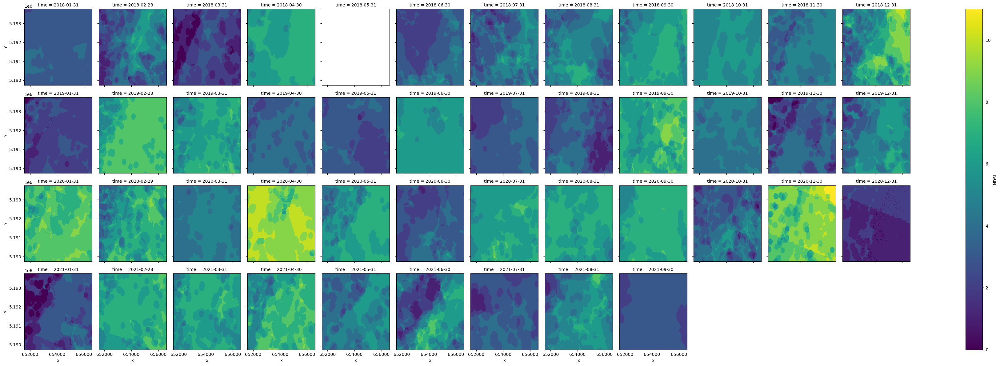

In [24]:
NDSI.resample(time='1ME').count().plot(col='time', col_wrap=12)

### Time series smoothing

A couple of other operations related to time series processing are straightforward with xarrays, such as smoothing and filtering with [rolling windows](https://docs.xarray.dev/en/stable/generated/xarray.DataArray.rolling.html). To test such methods, we first resample to a higher temporal resolution (one day) ("upsampling" in the xarrays documentation) and fill daily values by linear interpolation between observations.

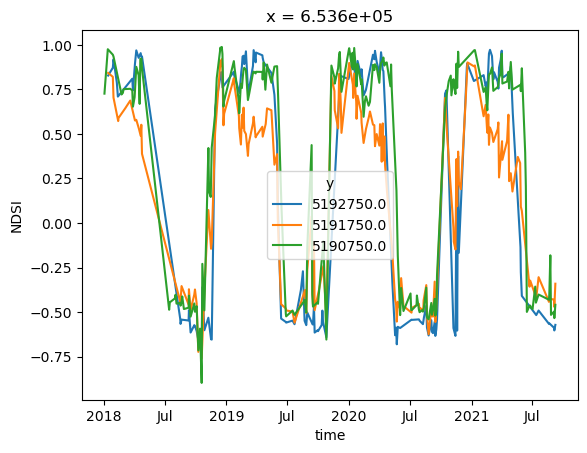

In [28]:
# Resample to 1 day temporal resolution
NDSI_interpolated = NDSI.resample(time='1d').interpolate()

# Interpolate the missing values along the time dimension
NDSI_interpolated = NDSI_interpolated.interpolate_na(dim='time')

# Plot the resulting time series at three points
NDSI_interpolated.isel(x=100, y=[50, 100, 150]).plot.line(x='time')

# Or in one line of code
#NDSI.resample(time='1d').interpolate().interpolate_na(dim='time').isel(x=100, y=[50, 100, 150]).plot.line(x='time')

Compute the 30-day rolling average of the NDSI time series and plot for one point (aggregation results are assigned the coordinate at the end of each window by default, but can be centered by passing center=True when constructing the rolling object):

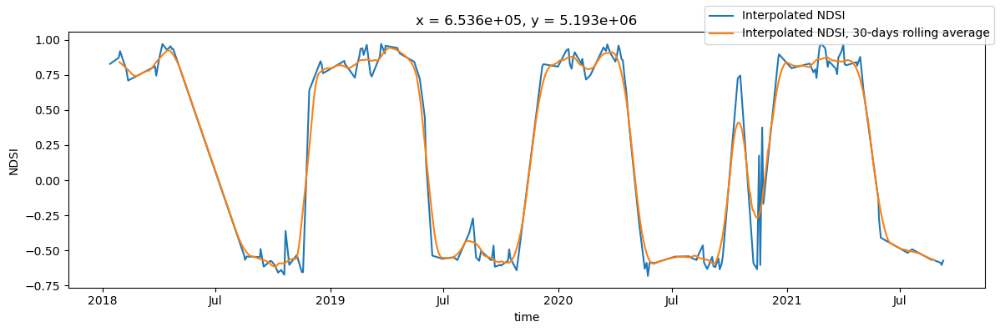

In [29]:
# Set up the plot
fig, axes = plt.subplots(1, 1, figsize=(12, 4))

# The daily NDSI values
NDSI_interpolated.isel(x=100, y=50).plot.line(label='Interpolated NDSI')

# Take the mean value over the NDSI values in a 30-day rolling window and plot the time series for one specific point
NDSI_interpolated.rolling(time=30, center=True).mean().isel(x=100, y=50).plot.line(label='Interpolated NDSI, 30-days rolling average')

# Show the legend and show the plot
fig.legend()
plt.tight_layout()